# Introduction to Neural Style Transfer Experimentation

Welcome to my exploration of neural style transfer, a captivating blend of artificial intelligence and artistic flair. In this notebook, I chronicle my journey through the creation of a custom neural network designed to meld the content of one image with the style of another. This process is inspired by the seminal work of Gatys et al. in their 2016 paper, which pioneered the use of deep learning to manipulate and combine visual artistry.

## Notebook Overview

This notebook is structured as follows:

1. **Custom CNN Architecture**:
   - I delve into the construction of a custom Convolutional Neural Network (CNN), detailing its layers and the rationale behind its design. Unlike the traditional VGG19 used in literature, I experimented with my own architectures to understand and engage with the model building process actively.

2. **Model Training and Evaluation**:
   - I describe the training steps, validation procedures, and epoch-wise progression of the CNN. This also includes the use of device-agnostic code to leverage GPU acceleration when available.

3. **Image Loading and Preprocessing**:
   - The preprocessing steps necessary for neural style transfer are outlined, ensuring images are appropriately sized and normalized for optimal model input.

4. **Feature Extraction and Gram Matrix**:
   - An in-depth look at the feature extraction process using the model, and the construction of Gram matrices to capture and quantify the style of images.

5. **Style Transfer Algorithm**:
   - The iterative process of adjusting a target image to adopt the style of another is explained, highlighting the balance between content and style representation.

6. **Challenges and Learnings**:
   - I reflect on the challenges faced during this project, including suboptimal style transfer results, potential reasons for these outcomes, and the limitations encountered due to a lack of quantitative evaluation methods.

7. **Concluding Reflections**:
   - In the final section, I offer some personal insights gained from this project, acknowledging the steep learning curve and expressing enthusiasm for future explorations in this field.

Join me on this artistic journey as I fuse the boundaries between neural network technology and the timeless quest for aesthetic expression.


Importing the necessary libraries

In [1]:
import os
from functools import partial
from typing import Any, cast, Dict, List, Optional, Union

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import random_split

import torchvision
from torchvision import transforms, models
from torchvision.datasets.utils import download_url

import tarfile
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

import time
from PIL import Image
from io import BytesIO
import numpy as np

import torch.optim as optim
import requests


import warnings
warnings.filterwarnings("ignore")

import wandb
import random

wandb.init(
    project="Neural-Style-Transfer",
    
    config={
    "learning_rate": 0.001,
    "architecture": "CNN",
    "dataset": "CIFAR-10",
    "epochs": 10,
    }
)


matplotlib.rcParams['figure.facecolor'] = '#ffffff'

/Users/suryanshshrivastava/miniforge3/envs/pytorch_m1/lib/python3.8/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: 'dlopen(/Users/suryanshshrivastava/miniforge3/envs/pytorch_m1/lib/python3.8/site-packages/torchvision/image.so, 0x0006): Symbol not found: __ZN3c106detail19maybe_wrap_dim_slowIxEET_S2_S2_b
  Referenced from: /Users/suryanshshrivastava/miniforge3/envs/pytorch_m1/lib/python3.8/site-packages/torchvision/image.so
  Expected in: /Users/suryanshshrivastava/miniforge3/envs/pytorch_m1/lib/python3.8/site-packages/torch/lib/libc10.dylib'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb:

### CIFAR-10 Dataset Download Instructions

Please execute the following code snippet `Only Once` to download the CIFAR-10 dataset, which is required to train the custom Convolutional Neural Network (CNN) architecture.


In [2]:
dataset_url = "https://s3.amazonaws.com/fast-ai-imageclas/cifar10.tgz"
download_url(dataset_url, '.')

with tarfile.open('./cifar10.tgz', 'r:gz') as tar:
    tar.extractall(path='./data')

  0%|          | 0/135107811 [00:00<?, ?it/s]

### Loading the CIFAR-10 Dataset

In [2]:
data_dir = './data/cifar10'

print(os.listdir(data_dir))
classes = os.listdir(data_dir + "/train")
print(classes)

['test', 'train']
['cat', 'dog', 'truck', 'bird', 'airplane', 'ship', 'frog', 'horse', 'deer', 'automobile']


In [3]:
from torchvision.datasets import ImageFolder
from torchvision.transforms import ToTensor

dataset = ImageFolder(data_dir+'/train', transform=ToTensor())

## Training and Validation Datasets

While building real world machine learning models, it is quite common to split the dataset into 3 parts:

1. **Training set** - used to train the model i.e. compute the loss and adjust the weights of the model using gradient descent.
2. **Validation set** - used to evaluate the model while training, adjust hyperparameters (learning rate etc.) and pick the best version of the model.
3. **Test set** - used to compare different models, or different types of modeling approaches, and report the final accuracy of the model.

Since there's no predefined validation set, we can set aside a small portion (5000 images) of the training set to be used as the validation set. We'll use the `random_split` helper method from PyTorch to do this. To ensure that we always create the same validation set, we'll also set a seed for the random number generator.

In [4]:
random_seed = 69
torch.manual_seed(random_seed)

In [5]:
val_size = 5000
train_size = len(dataset) - val_size

train_ds, val_ds = random_split(dataset, [train_size, val_size])
len(train_ds), len(val_ds)

(45000, 5000)

In [6]:
from torch.utils.data.dataloader import DataLoader

batch_size=128

In [7]:
train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=4, pin_memory=True)
val_dl = DataLoader(val_ds, batch_size*2, num_workers=4, pin_memory=True)

We can look at batches of images from the dataset using the `make_grid` method from `torchvision`. Each time the following code is run, we get a different bach, since the sampler shuffles the indices before creating batches.

/Users/suryanshshrivastava/miniforge3/envs/pytorch_m1/lib/python3.8/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: 'dlopen(/Users/suryanshshrivastava/miniforge3/envs/pytorch_m1/lib/python3.8/site-packages/torchvision/image.so, 0x0006): Symbol not found: __ZN3c106detail19maybe_wrap_dim_slowIxEET_S2_S2_b
  Referenced from: /Users/suryanshshrivastava/miniforge3/envs/pytorch_m1/lib/python3.8/site-packages/torchvision/image.so
  Expected in: /Users/suryanshshrivastava/miniforge3/envs/pytorch_m1/lib/python3.8/site-packages/torch/lib/libc10.dylib'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
/Users/suryanshshrivastava/miniforge3/envs/pytorch_m1/lib/python3.8/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Pyt

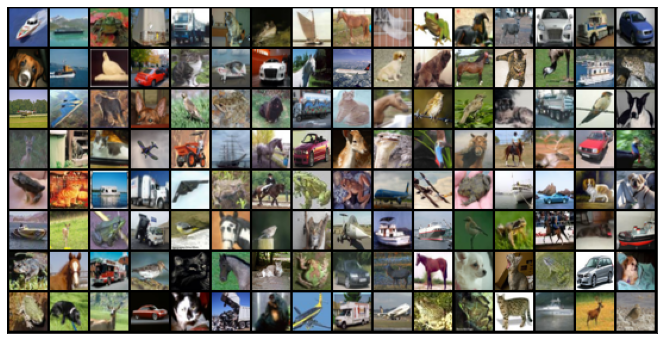

In [9]:
from torchvision.utils import make_grid

def show_batch(dl):
    for images, labels in dl:
        fig, ax = plt.subplots(figsize=(12, 6))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(images, nrow=16).permute(1, 2, 0))
        break
show_batch(train_dl)

### Image Classification Base Class

The provided code defines a Python class `ImageClassificationBase` that inherits from `nn.Module`, which is a standard neural network module provided by PyTorch.

- `training_step`: This method takes a batch of data, processes the images through the network (`self(images)`), and computes the loss using cross-entropy, which is typical for classification tasks.

- `validation_step`: Similar to the `training_step`, this method processes a batch of images to generate predictions and compute loss. Additionally, it calculates the accuracy of the predictions.

- `validation_epoch_end`: This method aggregates the losses and accuracies from each validation step, computes the mean, and logs them using `wandb.log`, which is a part of Weights & Biases logging tool.

- `epoch_end`: This method prints out the epoch number and the training and validation loss and accuracy after each epoch.

- `accuracy`: This is a standalone function that calculates the accuracy of the predictions by comparing them to the true labels.

This class is designed to be a base for building image classification models, where specific model architectures can inherit from this class and define their own forward pass.


In [8]:
class ImageClassificationBase(nn.Module):
    def training_step(self, batch):
        images, labels = batch 
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch 
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}
        
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()# Combine accuracies
        wandb.log({"Val_epoch_loss": epoch_loss.item(), "Val_epoch_acc": epoch_acc.item()})
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['train_loss'], result['val_loss'], result['val_acc']))
        
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

### CNN Model Class

The `CNN` class is an extension of the `ImageClassificationBase` class and represents a convolutional neural network specifically for image classification.

- `__init__`: This constructor initializes the CNN model. It accepts a `features` argument representing the feature extraction component of the CNN, which can be any `nn.Module` with a defined architecture. It also allows for specifying the number of classes (`num_classes`) the model should classify into (default is 10 for CIFAR-10 dataset) and a `dropout` rate to prevent overfitting.

- `forward`: This method defines the forward pass of the network. It takes an input tensor `x`, applies the `features` module to extract feature maps, reduces the feature maps' spatial dimensions to a fixed size using `avgpool`, flattens the pooled features, and finally passes them through the `classifier` which is a fully connected network to produce the final output.

The `features` parameter allows for flexibility in the CNN architecture by letting you plug in different feature extractors according to the limitations of my system.


In [9]:
class CNN(ImageClassificationBase):
    def __init__(
        self, features: nn.Module, num_classes: int = 10, dropout: float = 0.5
    ) -> None:
        super().__init__()
        self.features = features
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Linear(128 * 7 * 7, 4096),
            nn.ReLU(True),
            nn.Dropout(p=dropout),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

### Custom CNN Architecture for Neural Style Transfer

In the exploration of the neural style transfer task, I opted to utilize a custom CNN architecture instead of leveraging the widely-used pretrained VGG19 model. The decision to design and train a custom model stems from a desire to experiment and understand the intricacies of neural networks in the context of style transfer.

- **Innovation Over Pretrained Models**: The use of a pretrained model like VGG19, while effective and backed by literature, offers less room for learning and creativity. The development of a custom architecture allows for a deeper dive into the mechanics of neural networks and their application in style transfer.

- **Fun Factor**: Beyond the technical and educational aspects, there's an element of fun and challenge in testing one's own architecture against established models. It's a chance to push the boundaries and see how far a custom-built solution can go.

In summary, while VGG19 is a proven model for neural style transfer, the use of a custom CNN architecture is driven by the quest for innovation, tailored solutions, educational growth, and the sheer enjoyment of experimentation in the field of neural networks.


In [10]:
def make_layers(cfg: List[Union[str, int]], batch_norm: bool = False) -> nn.Sequential:
    layers: List[nn.Module] = []
    in_channels = 3
    for v in cfg:
        if v == "M":
            layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
        else:
            v = cast(int, v)
            conv2d = nn.Conv2d(in_channels, v, kernel_size=3, padding=1)
            if batch_norm:
                layers += [conv2d, nn.BatchNorm2d(v), nn.ReLU(inplace=True)]
            else:
                layers += [conv2d, nn.ReLU(inplace=True)]
            in_channels = v
    return nn.Sequential(*layers)

### VGG and Custom CNN Configurations

The `cfgs` dictionary contains a set of architectural configurations for convolutional neural networks. The keys "A" to "E" represent configurations for various VGG architectures, which are well-established and have been extensively used in the literature for tasks like image classification and neural style transfer.

- **VGG Architectures (A-E)**: These are predefined configurations that specify the number of filters in each convolutional layer and where max-pooling ("M") occurs. For example, "A" represents VGG11, "B" is VGG13, "D" is VGG16, and "E" is VGG19, with the number indicating the total count of weight layers.

- **Custom Architectures (F-H)**: These configurations were designed by me for experimental purposes, aiming to explore the performance of different structures in image classification tasks.

  - **Configuration "F"**: This is a lighter model with fewer filters, designed to be faster to train while still attempting to maintain good performance on image classification tasks. It achieved respectable results, proving that it is possible to obtain efficient models without excessive computational resources.
  
  - **Configuration "G" and "H"**: These are variations on "F", with slightly different arrangements of layers and filters, tailored to investigate their impact on the model's effectiveness and training time.

In conclusion, while the VGG architectures ("A" to "E") are known for their high performance, they come with the cost of longer training times. My custom configurations ("F" to "H") were an exploration into achieving a balance between accuracy and efficiency, with "F" in particular showing promise as a competent yet less resource-intensive alternative.


In [11]:
cfgs: Dict[str, List[Union[str, int]]] = {
    "A": [64, "M", 128, "M", 256, 256, "M", 512, 512, "M", 512, 512, "M"],
    "B": [64, 64, "M", 128, 128, "M", 256, 256, "M", 512, 512, "M", 512, 512, "M"],
    "D": [64, 64, "M", 128, 128, "M", 256, 256, 256, "M", 512, 512, 512, "M", 512, 512, 512, "M"],
    "E": [64, 64, "M", 128, 128, "M", 256, 256, 256, 256, "M", 512, 512, 512, 512, "M", 512, 512, 512, 512, "M"],
    "F": [16, "M", 32, "M", 64, 64, "M", 128, 128, "M"],
    "G": [32, "M", 32, "M", 64, 64, "M", 128, 128, "M"], 
    "H": [32, "M", 32, 32, "M", 64, 64, 64, "M", 128, 128, 128 "M"]
}

def _CNN(cfg: str, **kwargs: Any) -> CNN:
    model = CNN(make_layers(cfgs[cfg], batch_norm=False), **kwargs)
    return model

def MyArt(**kwargs: Any) -> CNN:
    return _CNN("F", **kwargs)

### Device Management for PyTorch

The provided code includes utility functions and a wrapper class for handling device placement of tensors in PyTorch, enabling the use of GPU acceleration if available.

- `get_default_device`: A function that checks if a GPU is available with CUDA support and returns the GPU device; otherwise, it falls back to the CPU.

- `to_device`: This function transfers the given data (which could be a single tensor or a list/tuple of tensors) to the specified device (CPU or GPU), facilitating non-blocking data transfers for improved efficiency.

- `DeviceDataLoader`: A class that wraps a standard PyTorch `DataLoader` to ensure that each batch of data it yields is automatically moved to the specified device. This is particularly useful when iterating over batches of data during training or inference to automatically use the GPU if available.

In practice, these utilities streamline the process of device management, making it easier to write device-agnostic code for PyTorch models.


In [12]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [65]:
model = MyArt()

In [66]:
device = get_default_device()
device

device(type='cpu')

In [67]:
train_dl = DeviceDataLoader(train_dl, device)
val_dl = DeviceDataLoader(val_dl, device)
model = to_device(model, device)

### Training and Evaluation Workflow in PyTorch

The code defines two functions, `evaluate` and `fit`, to handle the evaluation and training processes of a PyTorch model.

- `evaluate`: This function switches the model to evaluation mode (`model.eval()`), then processes batches from the validation loader (`val_loader`) using the model's `validation_step` method. It aggregates the results of these validation steps and computes an overall performance metric for the epoch using `model.validation_epoch_end`.

- `fit`: This function orchestrates the training process over a specified number of epochs. It sets up an optimizer (defaulted to SGD) with a given learning rate (`lr`). For each epoch, it:
  
  - Iterates over the training data (`train_loader`), computes the loss for each batch using `model.training_step`, and performs backpropagation (`loss.backward()`) and optimization steps (`optimizer.step()`).
  - Logs the training loss after each batch using Weights & Biases (`wandb.log`).
  - Conducts the validation phase by calling `evaluate`.
  - Saves the model state at specified epochs to a designated file path.

`history` is maintained to record the performance metrics after each epoch. The model's and optimizer's states, along with the average loss, are saved periodically to allow model checkpointing and recovery.


In [68]:
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

def fit(epochs, lr, model, train_loader, val_loader, opt_func=torch.optim.SGD):
    history = []
    optimizer = opt_func(model.parameters(), lr)
    
    for epoch in range(epochs):
        # Training Phase 
        print('Epoch: ', epoch)
        model.train()
        train_losses = []
        b = 1
        for batch in train_loader:
            loss = model.training_step(batch)
            print('Train Loss for Batch ', b,': ', loss.item())
            b += 1
            train_losses.append(loss)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            if(b%100):
                wandb.log({"Train_loss": loss.item()})
        # Validation phase
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        model.epoch_end(epoch, result)
        history.append(result)
        path = '/Users/suryanshshrivastava/Documents/NST/ArtF/model_epoch' + str(epoch) + '.pt'
        if(epoch in [0,5,7,9,10]):
            torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': torch.stack(train_losses).mean().item(),
            }, path)
    return history

In [72]:
evaluate(model, val_dl)

/Users/suryanshshrivastava/miniforge3/envs/pytorch_m1/lib/python3.8/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: 'dlopen(/Users/suryanshshrivastava/miniforge3/envs/pytorch_m1/lib/python3.8/site-packages/torchvision/image.so, 0x0006): Symbol not found: __ZN3c106detail19maybe_wrap_dim_slowIxEET_S2_S2_b
  Referenced from: /Users/suryanshshrivastava/miniforge3/envs/pytorch_m1/lib/python3.8/site-packages/torchvision/image.so
  Expected in: /Users/suryanshshrivastava/miniforge3/envs/pytorch_m1/lib/python3.8/site-packages/torch/lib/libc10.dylib'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
/Users/suryanshshrivastava/miniforge3/envs/pytorch_m1/lib/python3.8/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Pyt

{'val_loss': 0.973347008228302, 'val_acc': 0.6627527475357056}

### Model Loading and Training in PyTorch

The `load_model` function is designed to either load a pre-trained model from a checkpoint or train a new model from scratch.

- If `pt` is `True`, indicating that a pre-trained model should be used, the function loads the model state from the specified `pt_path` using `torch.load`, and then applies the saved state to the model's parameters with `model.load_state_dict`.

- If `pt` is `False`, the function initiates training by calling the `fit` function with specified training parameters: number of epochs (`num_epochs`), learning rate (`lr`), training and validation data loaders (`train_dl` and `val_dl`), and the optimization function (`opt_func`).

In the code snippet provided, `num_epochs`, `opt_func`, `lr`, and `pt_path` are defined as the training parameters. `load_model` is then called with `pt=True` to load a model checkpoint from an earlier training epoch, specifically epoch 7, using the Adam optimizer.

I have used the model trained after 7 epochs as it had the least validation loss as well as the best validation accuracy as indicated in the report below.

Link to pretrained checkpoint 7: [Checkpoint 7](https://drive.google.com/file/d/1BWN_RgEA1we_5ivSQqDikzHaNY_SfexB/view?usp=sharing)

Link to training report: [Report](https://wandb.ai/dunnucp/Neural-Style-Transfer/reports/Training-my-custom-CNN-Architecture--Vmlldzo2MDE2MDE0?accessToken=386k43u3ms3wnlc8ah8mglyf9lzxc59cppd5zo9mzo996lw9r4t7y3rcwp1bs7q2)

In [71]:
def load_model(model, pt = False,  pt_path = '',  opt_func = torch.optim.SGD):
    if(pt):
        checkpoint = torch.load(pt_path)
        model.load_state_dict(checkpoint["model_state_dict"])
    else:
        history = fit(num_epochs, lr, model, train_dl, val_dl, opt_func)

    return model

num_epochs = 10
opt_func = torch.optim.Adam
lr = 0.001
pt_path = ''

model = load_model(model, pt=True, pt_path = '/Users/suryanshshrivastava/Documents/NST/ArtF/model_epoch7.pt', opt_func = torch.optim.Adam) 
#Please change the location to use the pretrained checkpoint by downloading the checkpoint(link given in readme) and assigning an appropriat path
#Or else you can also train the model again by uncommenting the code below

# model = load_model(model, opt_func = opt_func)


### Extracting the feature maps from the custom CNN architecture for Neural Style Transfer.

In [73]:
model = model.features

for param in model.parameters():
    param.requires_grad_(False)



In [74]:
model.to(device)

Sequential(
  (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (4): ReLU(inplace=True)
  (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (7): ReLU(inplace=True)
  (8): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): ReLU(inplace=True)
  (10): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (11): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (12): ReLU(inplace=True)
  (13): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (14): ReLU(inplace=True)
  (15): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
)

### Image Loading and Preprocessing Function

The `load_image` function performs the following tasks:

1. **Image Loading**: It loads an image from a given path. If the path is a URL (starts with "http"), it fetches the image over the internet; otherwise, it loads the image from the local filesystem.

2. **Size Adjustment**: The image is resized to ensure its dimensions do not exceed 400 pixels, unless a different shape is specified, in which case the image is resized to that shape.

3. **Transformation Pipeline**: The image undergoes a series of transformations:
   - Resized to the determined size.
   - Converted to a PyTorch tensor.
   - Normalized with preset mean and standard deviation values (commonly used values for pre-trained models).

4. **Batch Dimension Addition**: An additional dimension is added at the beginning of the tensor to simulate a batch size of 1, making the image tensor compatible with models expecting input in batches.

The function returns the transformed image ready for model consumption.


In [96]:
def load_image(img_path, max_size=400, shape=None):
    ''' Load in and transform an image, making sure the image
       is <= 400 pixels in the x-y dims.'''
    if "http" in img_path:
        response = requests.get(img_path)
        image = Image.open(BytesIO(response.content)).convert('RGB')
    else:
        image = Image.open(img_path).convert('RGB')
    
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)
    
    if shape is not None:
        size = shape
        
    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406), 
                                             (0.229, 0.224, 0.225))])

    # discard the transparent, alpha channel (that's the :3) and add the batch dimension
    image = in_transform(image)[:3,:,:].unsqueeze(0)
    
    return image

In [97]:
content = load_image('https://c4.wallpaperflare.com/wallpaper/448/704/1004/cristiano-ronaldo-wallpaper-preview.jpg').to(device)
style = load_image('https://c4.wallpaperflare.com/wallpaper/743/193/102/vincent-van-gogh-painting-the-starry-night-classic-art-wallpaper-preview.jpg', shape=content.shape[-2:]).to(device)

In [98]:
def im_convert(tensor):
    """ Display a tensor as an image. """
    
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

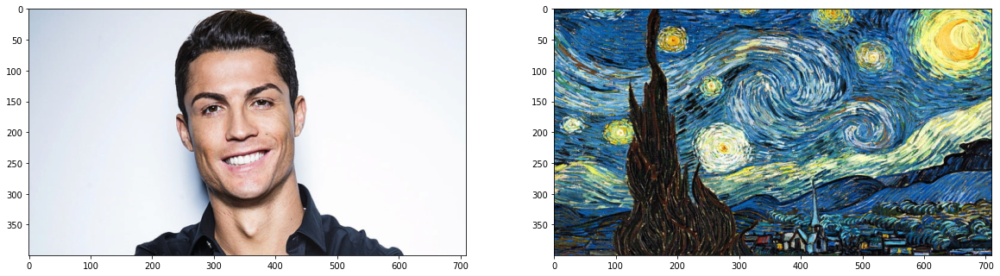

In [99]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax2.imshow(im_convert(style))


# Neural Style Transfer Implementation

This code implements the neural style transfer algorithm as described by Gatys et al. in their 2016 paper. The algorithm reimagines the content of one image in the style of another using the features extracted by a convolutional neural network (CNN).

## Feature Extraction

- `get_features`: This function passes an image through the model to extract features from specified layers. By default, these layers correspond to early and mid-level layers of the CNN, capturing content and style information.


In [100]:
def get_features(image, model, layers=None):
    """ Run an image forward through a model and get the features for 
        a set of layers.
    """
  
    if layers is None:
        layers = {
            '0': 'conv1_1',
            '3': 'conv2_1',
            '6': 'conv3_1',
            '8': 'conv3_2',
            '11': 'conv4_1', 
            '13': 'conv4_2', #content representation
            }
        
        

    features = {}
    x = image

    for name, layer in model._modules.items():
        x = layer(x) 
        if name in layers:
            features[layers[name]] = x
            
    return features

## Gram Matrix Calculation

- `gram_matrix`: Computes the Gram Matrix of a given tensor, representing the style of an image. It captures the correlations between different filter responses, providing a measure of texture or style.

### Gram Matrix in Neural Style Transfer

The Gram matrix is a crucial component in neural style transfer, providing a way to quantify the style of an image. Here's a concise explanation:

- **Reshape Feature Tensor**: The tensor from a network layer, originally `[b, d, h, w]` (batch size, depth, height, width), is reshaped to `[d, h*w]`, collapsing the spatial dimensions.

- **Matrix Multiplication**: The reshaped tensor is multiplied by its transpose, `torch.mm(tensor, tensor.t())`, resulting in a `[d, d]` Gram matrix. Each element measures the correlation between filters' outputs.

- **Style Representation**: Elements in the Gram matrix with high values indicate strong feature correlations, capturing the presence of specific styles (textures and patterns) in the image.

- **Role in Style Transfer**: In style transfer, the content image is transformed such that its Gram matrix matches the style image's Gram matrix, thus adopting the style characteristics.

The Gram matrix thus serves as a style target in the transfer process, allowing the algorithm to apply the stylistic essence of one image to the content of another.


In [101]:
def gram_matrix(tensor):
    """ Calculate the Gram Matrix of a given tensor 
    """
    
    b,d,h,w = tensor.size()
    tensor = tensor.view(d, h*w)
    gram = torch.mm(tensor, tensor.t())
    
    return gram 

## Style Transfer Process

1. **Content and Style Features**: The features for both content and style images are extracted using the `get_features` function.

2. **Style Gram Matrices**: Gram matrices for each style layer are computed from the style image's features.

3. **Target Image**: A clone of the content image is created, which will be modified to match the style image's features.

4. **Weights and Losses**: Weights are assigned to different layers to define their contribution to the style. Higher weights are assigned to the initial layers as they are more representative of the style of the image. The content and style losses are then computed by comparing the target image's features and gram matrices with those of the content and style images, respectively.

5. **Optimization**: An optimizer is used to iteratively adjust the target image to minimize the weighted content and style losses.



In [102]:
content_features = get_features(content, model)
style_features = get_features(style, model)

style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

target = content.clone().requires_grad_(True).to(device)

In [103]:
style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.8,
                 'conv3_1': 0.4,
                 'conv4_1': 0.2}


content_weight = 1  # alpha
style_weight = 1e10 # Beta

## Training Loop

During each step of the loop:

- The target's features are extracted.
- The content loss is calculated based on the difference in content features between the target and content images.
- The style loss is computed by comparing the target's Gram matrices to the style's Gram matrices, scaled by the layer's weight.
- The total loss is a weighted sum of content and style losses, which is backpropagated to update the target image.

## Visualization

Periodically, the current state of the styled target image is displayed, showing the progress of the style transfer.

This algorithm effectively captures the essence of the style image's textures and patterns and applies them to the content image, resulting in a synthesized image that blends the content and style in a visually coherent manner.

Total loss:  7584817872896.0


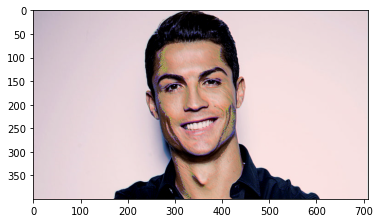

Finishing 200 epoch in: 1.03 minutes
Total loss:  2456745934848.0


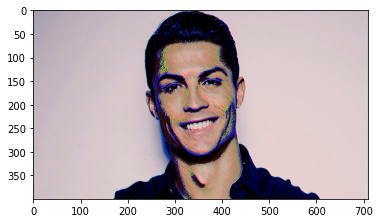

Finishing 400 epoch in: 2.29 minutes
Total loss:  873010888704.0


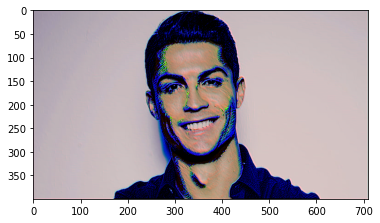

Finishing 600 epoch in: 3.5 minutes
Total loss:  401186783232.0


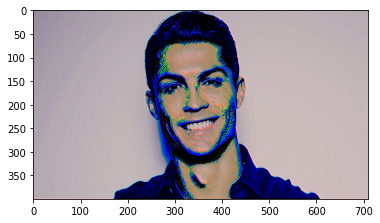

Finishing 800 epoch in: 4.74 minutes
Total loss:  206084030464.0


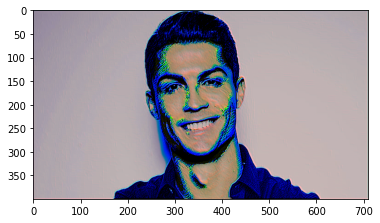

Finishing 1000 epoch in: 5.66 minutes
Total loss:  117350899712.0


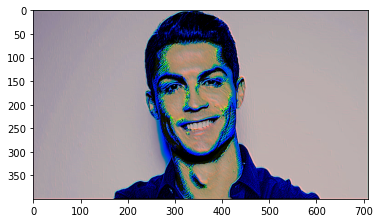

Finishing 1200 epoch in: 6.46 minutes
Total loss:  73395732480.0


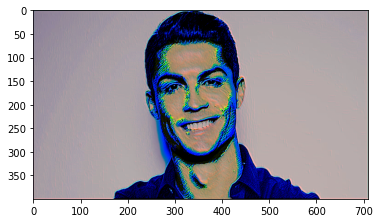

Finishing 1400 epoch in: 7.29 minutes
Total loss:  49452314624.0


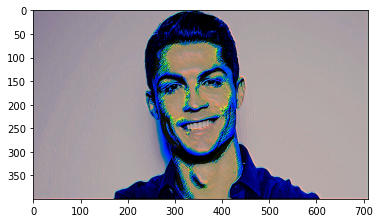

Finishing 1600 epoch in: 8.1 minutes
Total loss:  35333816320.0


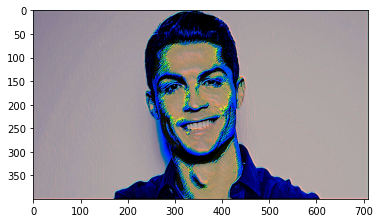

Finishing 1800 epoch in: 9.03 minutes
Total loss:  26532892672.0


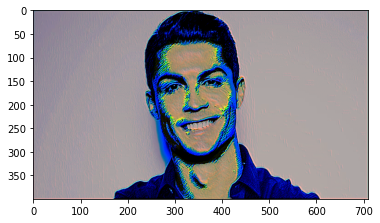

Finishing 2000 epoch in: 10.0 minutes
Total loss:  20731693056.0


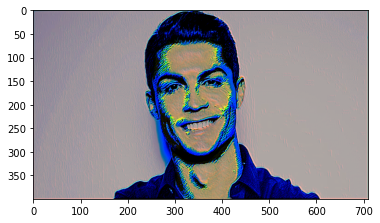

Finishing 2200 epoch in: 10.87 minutes
Total loss:  16722736128.0


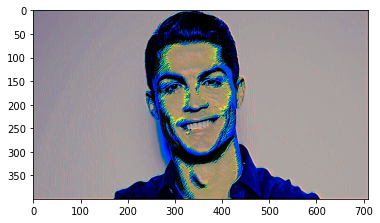

Finishing 2400 epoch in: 11.66 minutes
Total loss:  13807607808.0


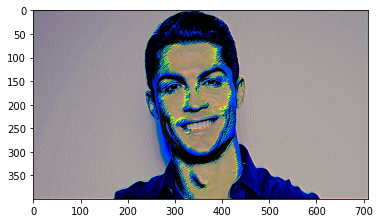

Finishing 2600 epoch in: 12.46 minutes
Total loss:  11594152960.0


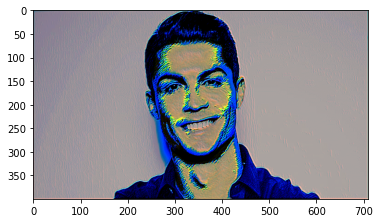

Finishing 2800 epoch in: 13.24 minutes
Total loss:  9857399808.0


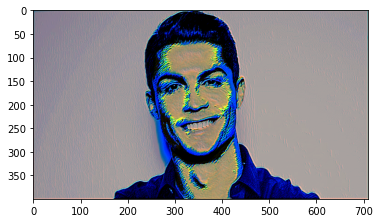

Finishing 3000 epoch in: 14.04 minutes
Total loss:  8455166976.0


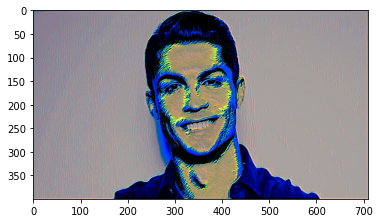

Finishing 3200 epoch in: 14.93 minutes
Total loss:  7299228160.0


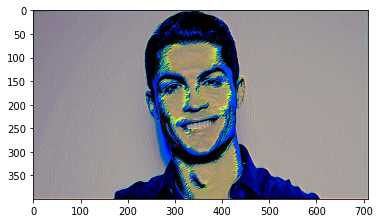

Finishing 3400 epoch in: 16.21 minutes
Total loss:  6335288832.0


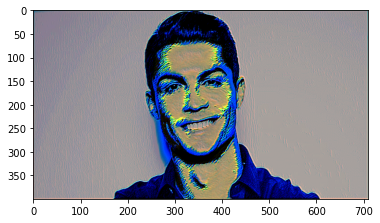

Finishing 3600 epoch in: 17.55 minutes
Total loss:  5525585408.0


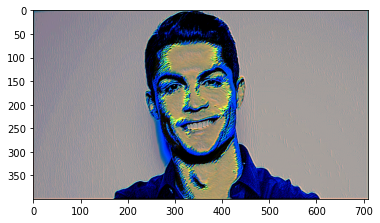

Finishing 3800 epoch in: 18.62 minutes
Total loss:  4835504128.0


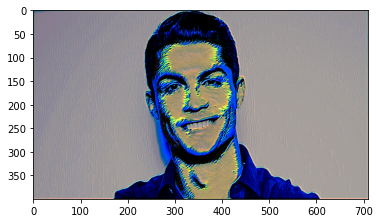

Finishing 4000 epoch in: 19.74 minutes
Total loss:  4246572032.0


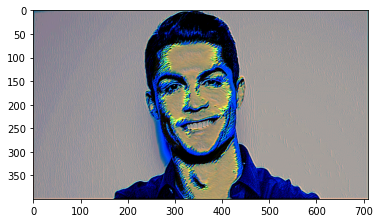

Finishing 4200 epoch in: 20.87 minutes
Total loss:  3742965248.0


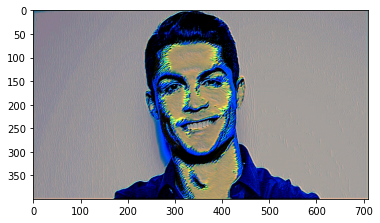

Finishing 4400 epoch in: 22.63 minutes
Total loss:  3307991552.0


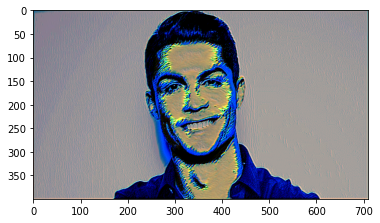

Finishing 4600 epoch in: 24.01 minutes
Total loss:  2931846400.0


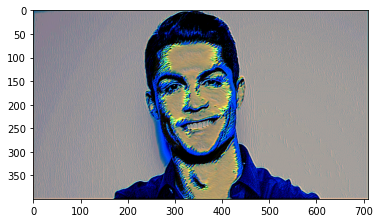

Finishing 4800 epoch in: 25.21 minutes
Total loss:  2603481088.0


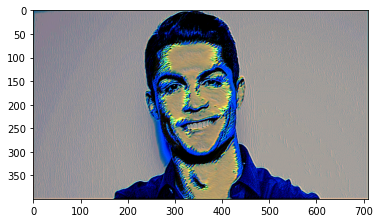

Finishing 5000 epoch in: 26.27 minutes
Total loss:  2316811008.0


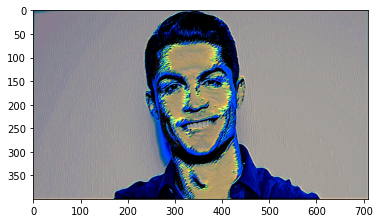

Finishing 5200 epoch in: 27.23 minutes
Total loss:  2064839040.0


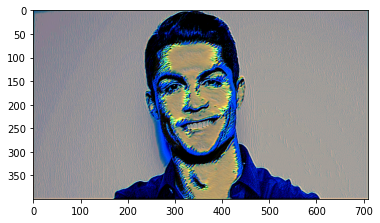

Finishing 5400 epoch in: 28.21 minutes
Total loss:  1843455104.0


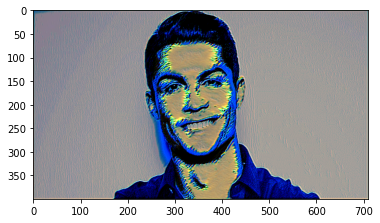

Finishing 5600 epoch in: 29.36 minutes
Total loss:  1648403072.0


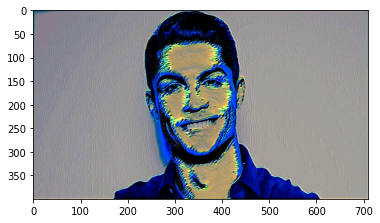

Finishing 5800 epoch in: 30.99 minutes
Total loss:  1475617024.0


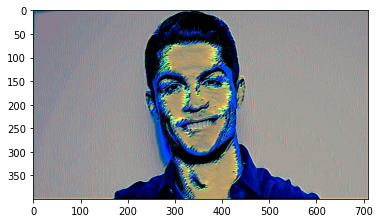

Finishing 6000 epoch in: 32.5 minutes
Total loss:  1323007616.0


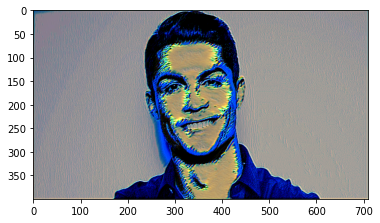

Finishing 6200 epoch in: 33.5 minutes
Total loss:  1187016960.0


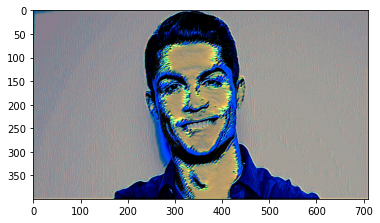

Finishing 6400 epoch in: 35.19 minutes
Total loss:  1065666496.0


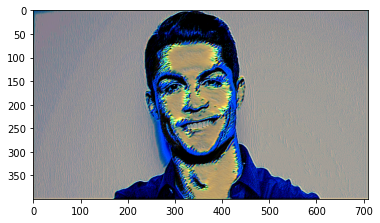

Finishing 6600 epoch in: 36.67 minutes
Total loss:  956993600.0


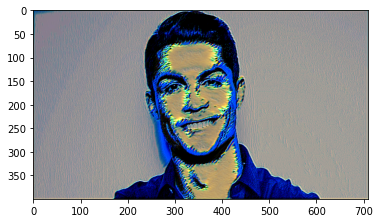

Finishing 6800 epoch in: 38.34 minutes
Total loss:  859321536.0


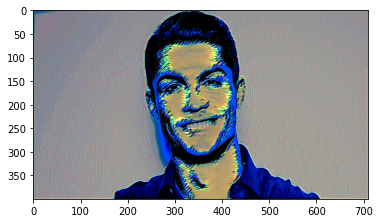

Finishing 7000 epoch in: 39.44 minutes
Total loss:  771680000.0


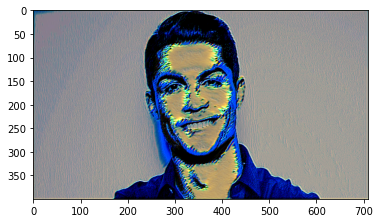

Finishing 7200 epoch in: 40.6 minutes
Total loss:  693180928.0


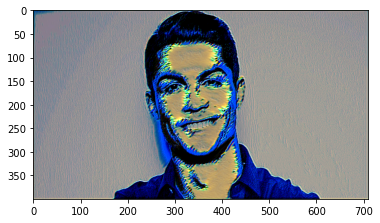

Finishing 7400 epoch in: 41.61 minutes
Total loss:  622937024.0


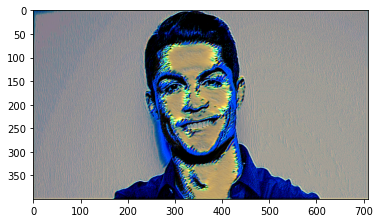

Finishing 7600 epoch in: 42.66 minutes
Total loss:  560046400.0


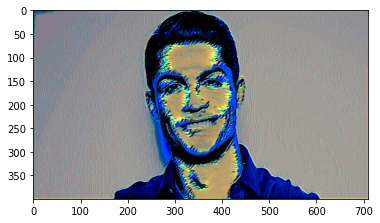

Finishing 7800 epoch in: 43.88 minutes
Total loss:  503722432.0


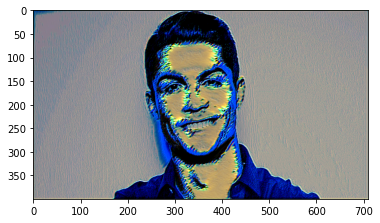

Finishing 8000 epoch in: 44.82 minutes
Total loss:  453179456.0


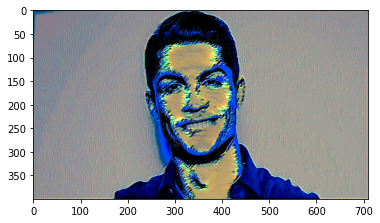

Finishing 8200 epoch in: 45.7 minutes
Total loss:  407675360.0


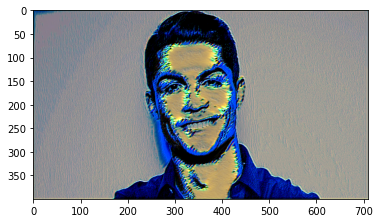

Finishing 8400 epoch in: 46.56 minutes
Total loss:  366532608.0


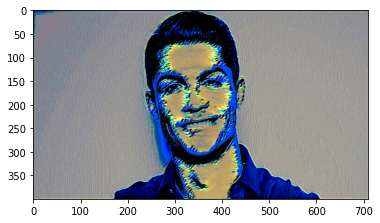

Finishing 8600 epoch in: 47.4 minutes
Total loss:  329417440.0


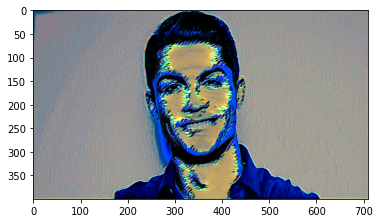

Finishing 8800 epoch in: 48.26 minutes
Total loss:  296182592.0


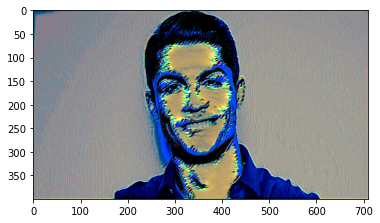

Finishing 9000 epoch in: 49.08 minutes
Total loss:  266433520.0


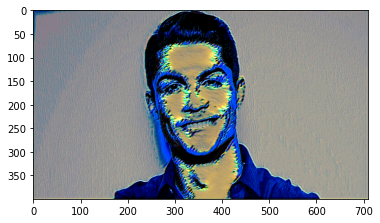

Finishing 9200 epoch in: 50.13 minutes
Total loss:  239802768.0


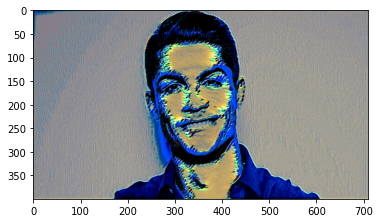

Finishing 9400 epoch in: 51.37 minutes
Total loss:  215615760.0


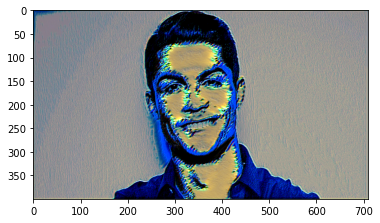

Finishing 9600 epoch in: 52.78 minutes
Total loss:  193692000.0


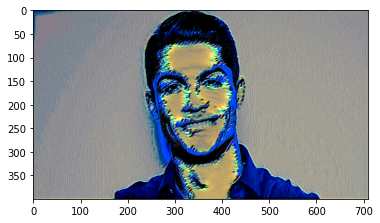

Finishing 9800 epoch in: 53.94 minutes
Total loss:  173928352.0


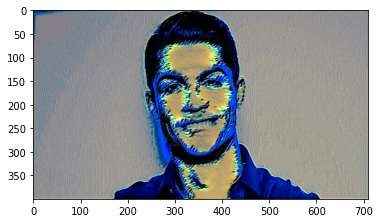

Finishing 10000 epoch in: 54.92 minutes


KeyboardInterrupt: 

In [104]:
start = time.time()
show_every = 200

optimizer = optim.Adam([target], lr=0.003)
steps = 10000  

for ii in range(1, steps+1):
    

    target_features = get_features(target, model)
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
    
    style_loss = 0
    for layer in style_weights:
        target_feature = target_features[layer]
        _, d, h, w = target_feature.shape
        
        target_gram = gram_matrix(target_feature)
        
        style_gram = style_grams[layer]
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        
        style_loss += layer_style_loss / (d * h * w)
        
        
    total_loss = style_weight*style_loss + content_weight*content_loss
    

    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    if  ii % show_every == 0:
        print('Total loss: ', total_loss.item())
        plt.imshow(im_convert(target))
        plt.show()
        print(f"Finishing {ii} epoch in: {round(((time.time() - start)/60),2)} minutes")

print(f"completed in {round(((time.time() - start)/60),2)} minutes")

### Results after 10000 epochs
### Running it for more epochs could lead to better style adaptation as the loss is decreasing at a rapid rate.

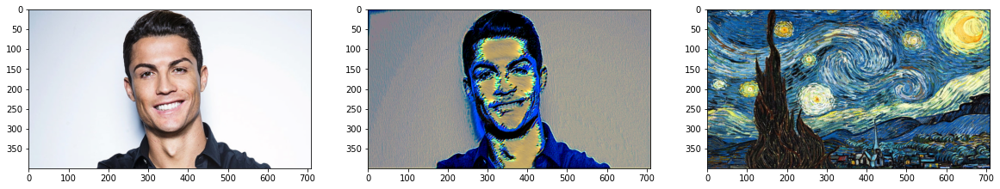

In [105]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax2.imshow(im_convert(target))
ax3.imshow(im_convert(style))

# Concluding Thoughts on Neural Style Transfer

In this notebook, I've dipped my toes into the intriguing waters of neural style transfer, blending the structured world of deep learning with the fluidity of artistic style. Here's a snapshot of my journey:

**Key Takeaways:**

1. **Mixed Results**: The style transfer didn't quite hit the mark. The styles were there, but they didn't shine through as hoped.

2. **Reasons to Ponder**:
   - My custom CNN might not have been up to the task of capturing style effectively, which could be due to how I trained it or the way it's built. This is somewhat backed up by the test set accuracy of around 67%.
   - I tried to speed up the style transfer by adjusting other parts of the process instead of letting the loss decrease at its own pace.
   - Experimentaion on different wieghts for feature layers and also the weights for content loss and style loss wasn't performed and was taken on face value from literature. I think experimenting with these values might also result in better performance.

3. **Evaluation Road Not Taken**:
   - I didn't manage to set up a way to measure how well the style transfer worked. Time was tight with exams and job interviews filling up my schedule.

4. **Learning Galore**:
   - Despite the hiccups, I've learned a ton from trying out neural style transfer. It's a field I've barely explored before, and it's been fascinating to see what's possible.

5. **Future Plans**:
   - I'm keen to keep playing with this technology and see if I can get better results down the line.
   - Here's hoping that this experience helps me in the next steps of my journey. 
   
TEEHEE, fingers crossed for what's to come!

